In [1]:
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display
import soundfile as sf
import speech_recognition as sr

from jiwer import wer, cer
from IPython.display import Audio

import whisper

# Loading and Visualizing an Audio File

In [2]:
audio_signal, sample_rate = librosa.load('speech_01.wav', sr=None)

In [3]:
audio_signal

array([ 0.0000000e+00, -4.7802925e-05, -2.9921532e-05, ...,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
      shape=(1036871,), dtype=float32)

In [4]:
sample_rate

44100

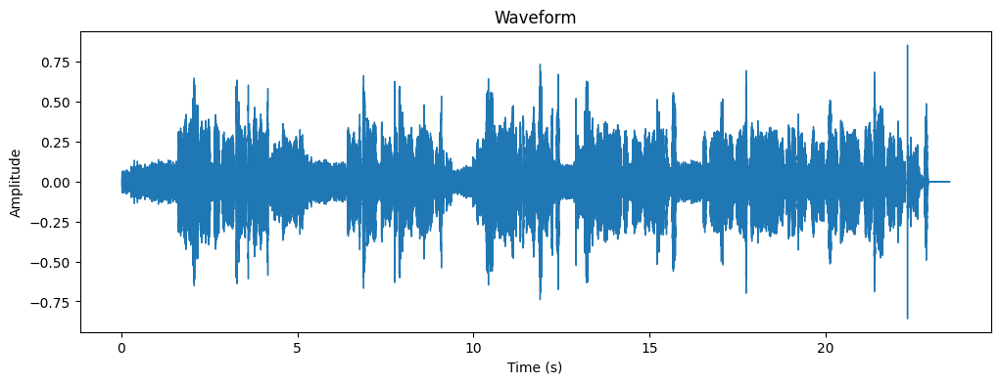

In [5]:
plt.figure(figsize=(12, 4))
librosa.display.waveshow(audio_signal, sr=sample_rate)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# Play the audio in the notebook
Audio('speech_01.wav')

# Transcribing Audio with Google Web Speech API

In [6]:
recognizer = sr.Recognizer()

In [7]:
file_path = 'speech_01.wav' 

In [8]:
def transcribe_audio(file_path):
    with sr.AudioFile(file_path) as source:
        audio_data = recognizer.record(source)
        text = recognizer.recognize_google(audio_data)
        print(text)
        return text    
transcribed_text = transcribe_audio(file_path)

my name is Yvonne and I am excited to have you as part of our Learning Community before we get started I'd like to tell you a little bit about myself I'm a sound engineer turn data scientist curious about machine learning and artificial intelligence my professional background is primarily in media production with a focus on audio it and Communications


In [9]:
ground_truth = """My name is Ivan and I am excited to have you as part of our learning community! 
Before we get started, I’d like to tell you a little bit about myself. I’m a sound engineer turned data scientist,
curious about machine learning and Artificial Intelligence. My professional background is primarily in media production,
with a focus on audio, IT, and communications"""

In [10]:
calculated_wer = wer(ground_truth, transcribed_text)
calculated_cer = cer(ground_truth, transcribed_text)
print(f"Word Error Rate (WER): {calculated_wer:.4f}")
print(f"Character Error Rate (CER): {calculated_cer:.4f}")

Word Error Rate (WER): 0.3390
Character Error Rate (CER): 0.0801


# Background Noise and Spectrograms

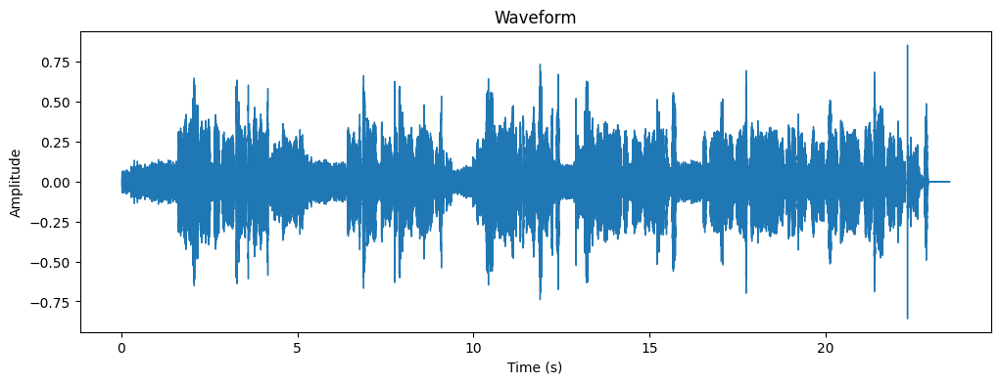

In [11]:
plt.figure(figsize=(12, 4))
librosa.display.waveshow(audio_signal, sr=sample_rate)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# Play the audio in the notebook
Audio('speech_01.wav')

In [12]:
# Compute the Short-Time Fourier Transform (STFT) of the filtered audio
# This converts the time-domain signal into a frequency-domain representation
S = librosa.stft(audio_signal)

In [13]:
S

array([[-8.67757127e-02+0.0000000e+00j, -2.16521434e-02+0.0000000e+00j,
         4.71511856e-02+0.0000000e+00j, ...,
         0.00000000e+00+0.0000000e+00j,  0.00000000e+00+0.0000000e+00j,
         0.00000000e+00+0.0000000e+00j],
       [ 9.89650860e-02-3.3857092e-02j, -3.12002711e-02+8.8045798e-02j,
        -3.15121226e-02-1.0418473e-02j, ...,
         0.00000000e+00+0.0000000e+00j,  0.00000000e+00+0.0000000e+00j,
         0.00000000e+00+0.0000000e+00j],
       [-1.99844286e-01+1.6290674e-01j,  1.74084887e-01-3.7885439e-02j,
        -4.55934368e-02-6.4477079e-02j, ...,
         0.00000000e+00-0.0000000e+00j,  0.00000000e+00-0.0000000e+00j,
         0.00000000e+00-0.0000000e+00j],
       ...,
       [ 4.24832251e-05-5.6672663e-05j, -3.40010920e-05+7.5565295e-05j,
        -2.43012564e-05-4.2304982e-06j, ...,
         0.00000000e+00+0.0000000e+00j,  0.00000000e+00+0.0000000e+00j,
         0.00000000e+00+0.0000000e+00j],
       [ 2.30733876e-05+5.4863976e-05j,  6.48604691e-05-3.2895885e-0

In [14]:
# Complex matrix to dB(decibels)
S_dB = librosa.amplitude_to_db(abs(S), ref=np.max)

In [15]:
np.max(S_dB)

np.float32(0.0)

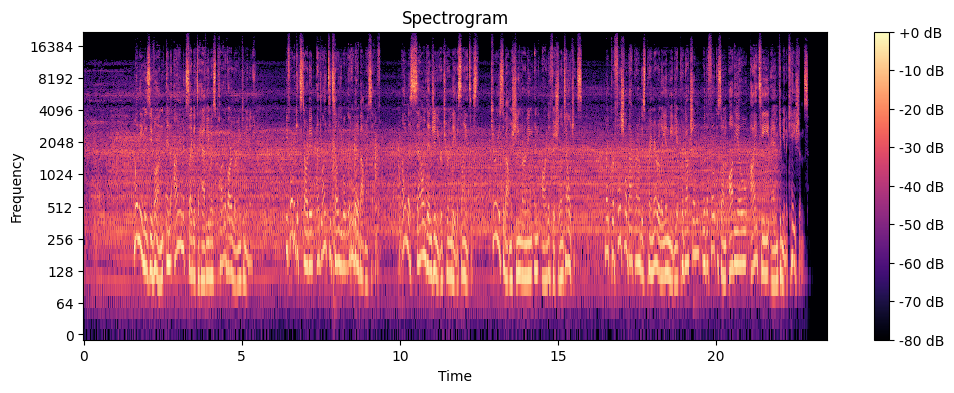

In [16]:
# Plot the spectrogram
plt.figure(figsize=(12, 4))
librosa.display.specshow(data = S_dB, sr=sample_rate, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.show()

In [17]:
# Apply a pre-emphasis filter to the audio signal
# This filter emphasizes high-frequency components of the audio
# High frequencies often carry important speech details, like consonants
# Emphasizing them can improve speech recognition accuracy
# The coef parameter controls the strength of the filter (default 0.97)
signal_filtered = librosa.effects.preemphasis(audio_signal, coef=0.96)

# Save the filtered audio to a new WAV file
# This allows us to listen to and process the filtered audio separately
sf.write('filtered_speech_01.wav', signal_filtered, sample_rate)
output_file = 'filtered_speech_01.wav'

In [18]:
# Play the original audio file
print("Playing original audio:")
Audio(file_path)

Playing original audio:


In [19]:
# Play the filtered audio file
print("Playing filtered audio:")
Audio(output_file)

Playing filtered audio:


In [20]:
# Compute the spectrogram
Sb = librosa.stft(signal_filtered)

In [21]:
S_dBb = librosa.amplitude_to_db(abs(Sb), ref=np.max)

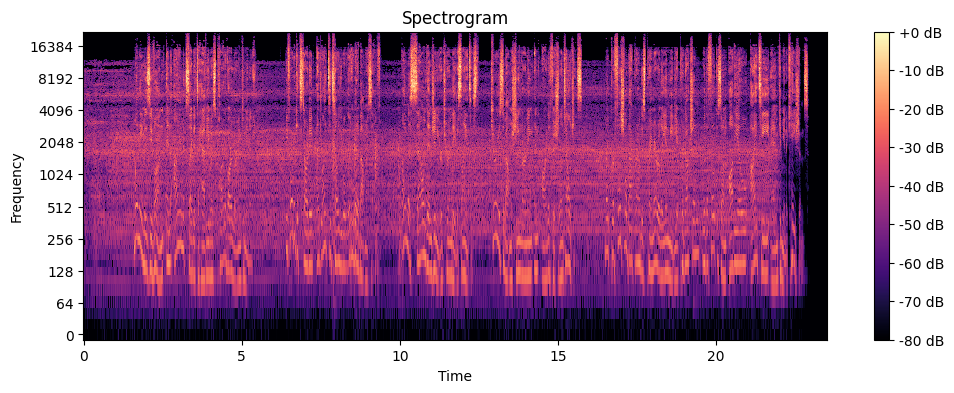

In [22]:
# Plot the spectrogram
plt.figure(figsize=(12, 4))
librosa.display.specshow(data = S_dBb, sr=sample_rate, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.show()

In [23]:
transcribed_text_preemphasis = transcribe_audio('filtered_speech_01.wav')

my name is Yvonne and I am excited to have you as part of our Learning Community before we get started I'd like to tell you a little bit about myself I'm a sound engineer turn data scientist curious about machine learning and artificial intelligence my professional background is primarily in media production with a focus on audio it and Communications


In [24]:
calculated_wer = wer(ground_truth, transcribed_text_preemphasis)
calculated_cer = cer(ground_truth, transcribed_text_preemphasis)
print(f"Word Error Rate (WER): {calculated_wer:.4f}")
print(f"Character Error Rate (CER): {calculated_cer:.4f}")

Word Error Rate (WER): 0.3390
Character Error Rate (CER): 0.0801


# Transciribing Audio with OpenAI's Whisper

In [25]:
# base / small / medium / large
model = whisper.load_model("base")

In [26]:
result = model.transcribe(file_path)

C:\Users\asus\miniconda3\envs\speech_env\Lib\site-packages\whisper\transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")


In [27]:
transcribed_text_whisper = result["text"]
transcribed_text_whisper

" My name is Yvonne and I am excited to have you as part of our learning community. Before we get started, I'd like to tell you a little bit about myself. I'm a sound engineer turned a scientist, curious about machine learning and artificial intelligence. My professional background is primarily in media production, with a focus on audio, IT and communications."

In [28]:
result["language"]

'en'

In [29]:
calculated_wer = wer(ground_truth, transcribed_text_whisper)
calculated_cer = cer(ground_truth, transcribed_text_whisper)
print(f"Word Error Rate (WER): {calculated_wer:.4f}")
print(f"Character Error Rate (CER): {calculated_cer:.4f}")

Word Error Rate (WER): 0.2203
Character Error Rate (CER): 0.0470
